# CNN - Convolutional Neural Network

Used for Image and Video frame classification and other stuff.

https://medium.com/@manasnarkar/image-classification-with-convolution-neural-networks-cnn-with-keras-dbd71c05ed2a



Filters will be used to find out the edges like vertical and horizontal. Image will have grey and RGB varient in which grey image is black and white image and RGB is coloured.

grey image will have matrix value ranging 0 - 255 can say 4x4 and RGB is also having the same matrix range and 4x4x3 in which 3 is 3 frame of RGB.

We can normalise this value into 0 to 1 thorugh min and max scaler.

Initially we have 6x6 image and apply 3x3 filter (vertical and horizontal) to make a output of 4x4. we have multiple filters which is reponsible for dectecting image like edges and other things in image.

formula for output is n - f +1 = size of output. We are jumping to one step in this case. We are making 4x4 from 6x6 which means we are losing some information. What if we want same size of output as input then we will use padding.

Padding is just something we add one column at each side and fill with some value like 0 or nearest number. so that we will make output of same size as input. Formula would be n + 2p - f + 1 = output size. We use zero padding and fill 0 in each box.
We can do also to fill nearest value to each box.



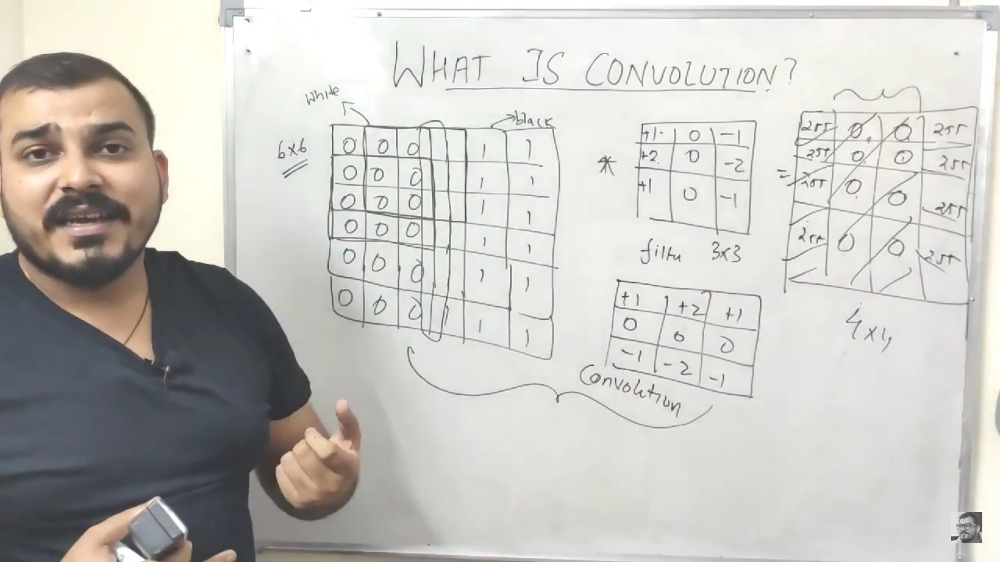

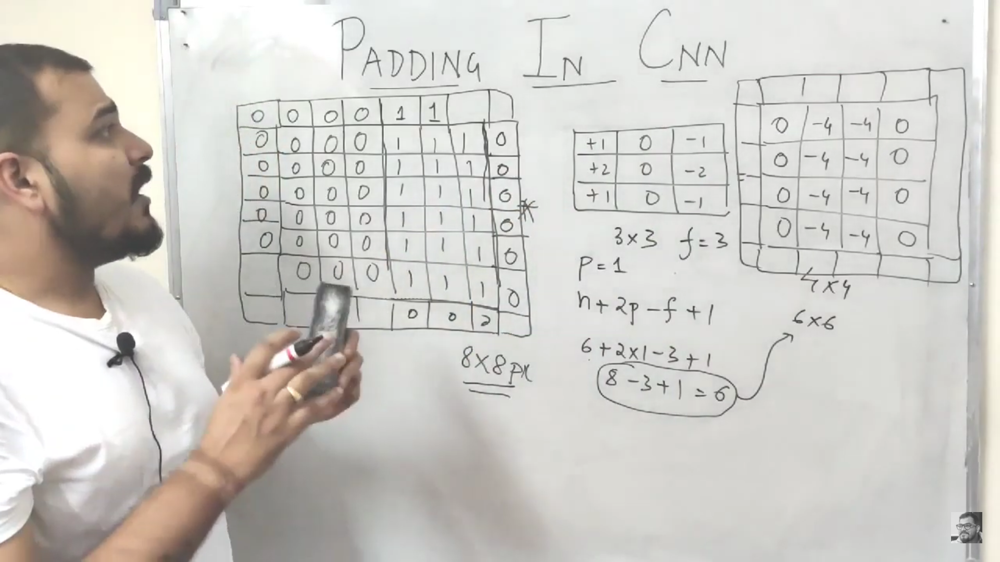

Operation of CNN is same as ANN just only difference that CNN have FILTERS intead of weights. 

In ANN, input gets multiply by weights and add some bais then activation function gets applied to result.

In CNN, Inputs gets multiplied by filter (vertical and horizontal) then activation function gets applied to result on each and every value.

This is one layer of CNN and we can have multiple layer horizontally like this so it will detect every edges and full image.

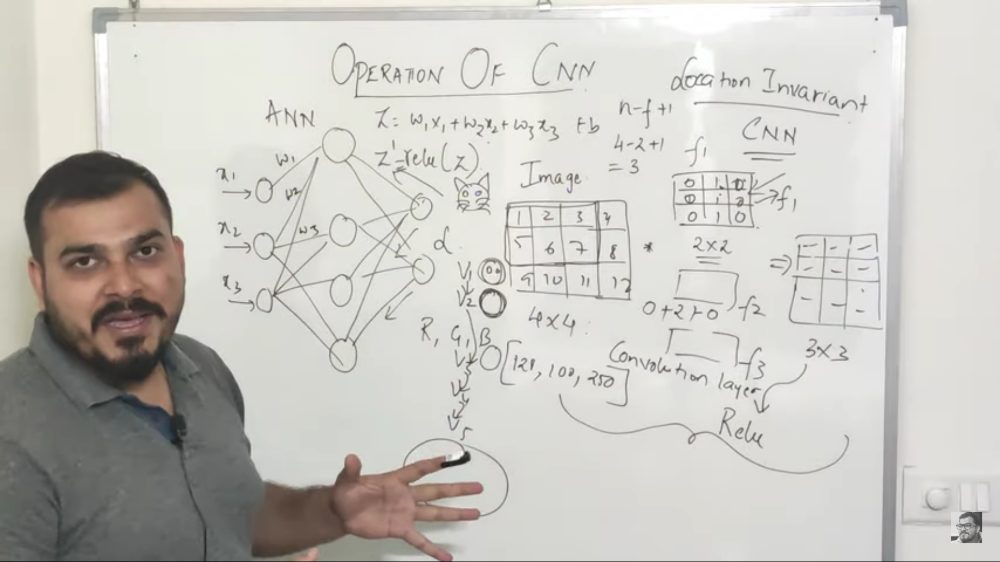

#### Max Pooling - 

It is picking or fetching maximum value (or pixel value) or higher intensity value from the filter matrix. It took stride or jump as 2. We cannot take stride value 1 because we took higher intensity value. CNN will have combination of Filters and Max polling in horizontal manner. Polling layer will be like max, min and average pooling.



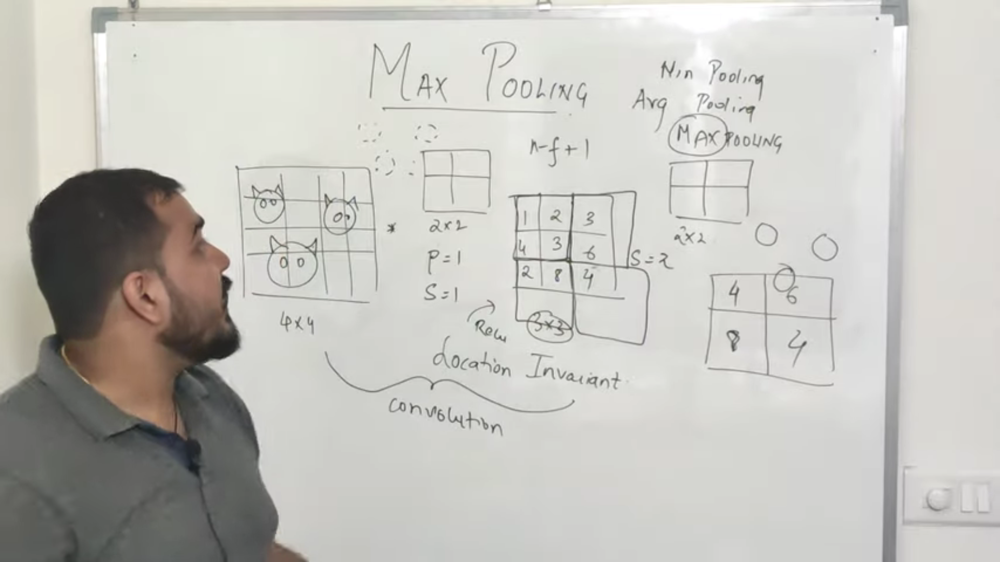

#### Data Augmentation

Data Augmentation means it transform image into diff types of images like flipping, horizontal and vertical shifting and zoom or add some noise etc.

So CNN model will become robost and train properly because we have more training data for one images. It is creating invariance.

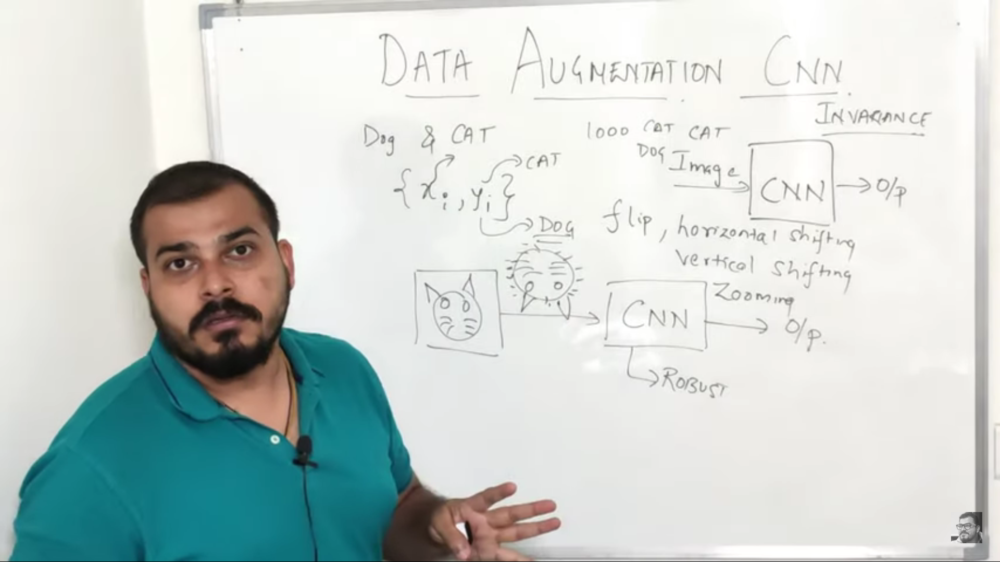

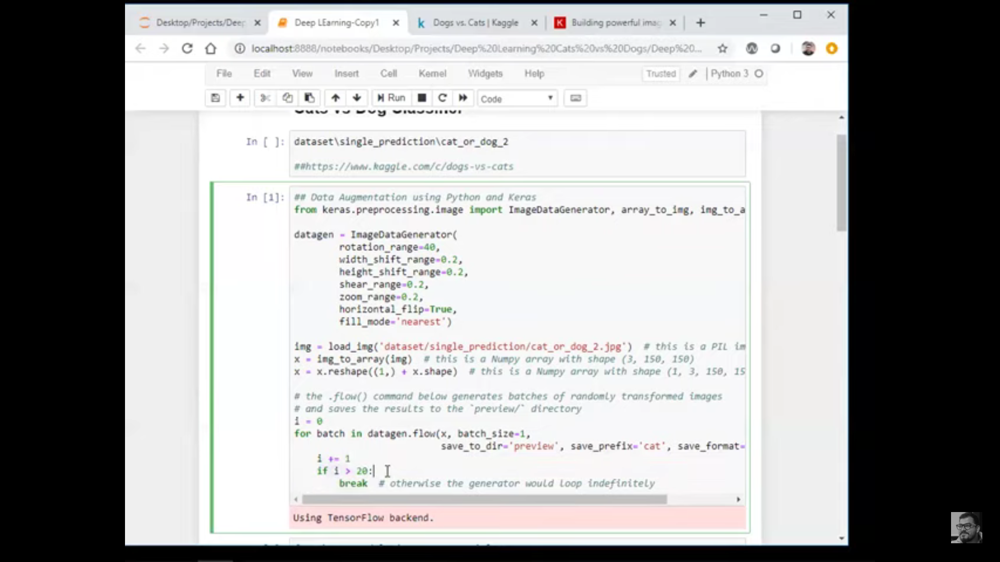

## Sample Design for VGG16

In Imagenet , we will have 1000 categories so output will be 1000. We can give 50*50*3 instead of 224*224*3 depends on quality of image. In below image, firstly 224*224*3 size of imput will pass to the 3*3 filter and stride is and padding is same and number of filters would be 64 so output would be 224*224*64 then it pass trough max pool whise filter size is 2*2 and stride would be 2 so now output size is 112*112*128 ans so on. Please see below formula.

In case of VGG16, all the parameter sie would be fixed.IN Alexnet, Paarmeter size would not be same it means sometimes it use filter size diff and stride 2 or sometime it use diff filter and max pool and stride 4. Itis beacuse of experimenting.

IN VGG16, its general architechture. The concept of the VGG19 model (also VGGNet-19) is the same as the VGG16 except that it supports 19 layers. The “16” and “19” stand for the number of weight layers in the model (convolutional layers). This means that VGG19 has three more convolutional layers than VGG16

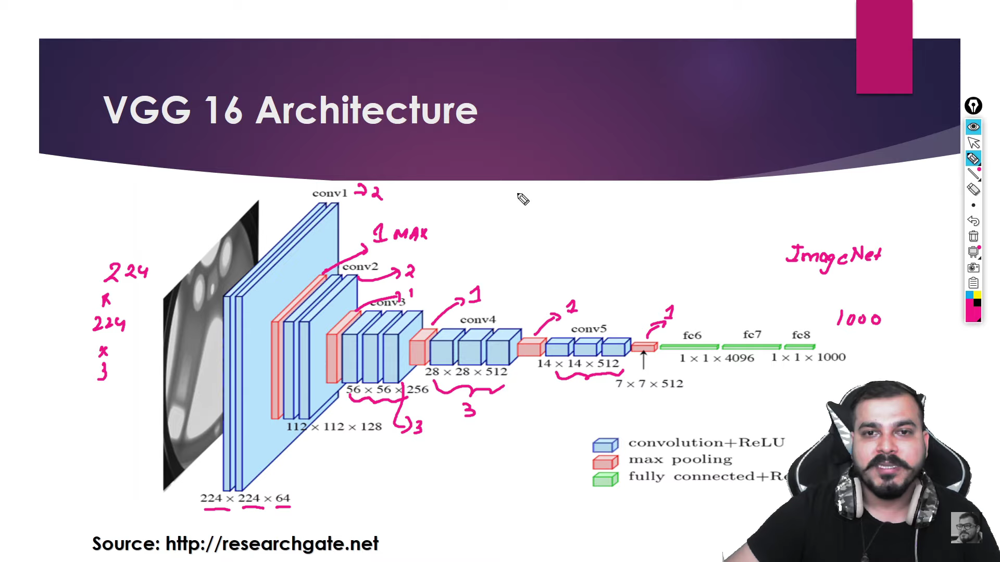

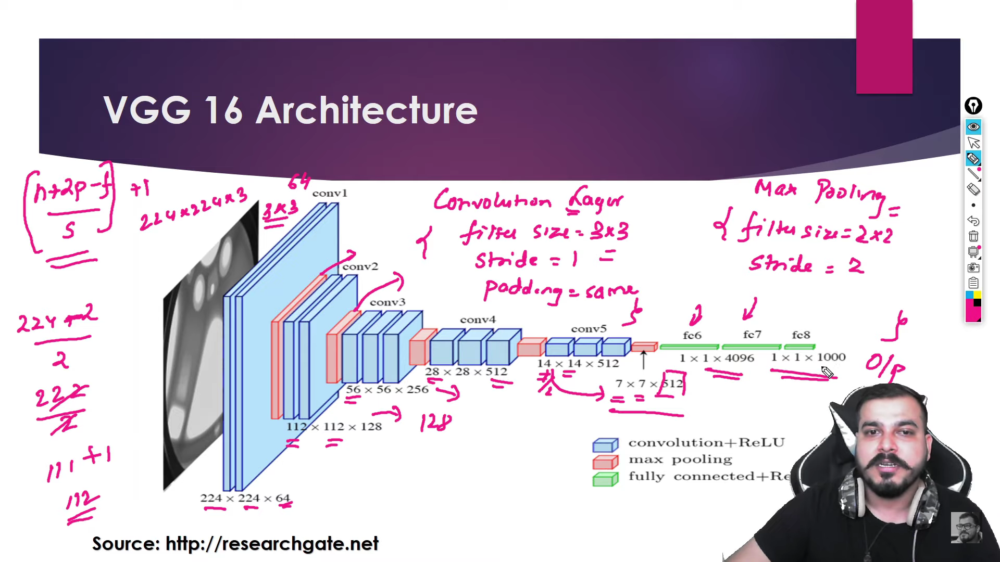

In [ ]:

# -*- coding: utf-8 -*-
"""
@author: Krish.Naik
"""

from keras.layers import Input, Lambda, Dense, Flatten
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

# re-size all the images to this
IMAGE_SIZE = [224, 224]

train_path = 'Datasets/Train'
valid_path = 'Datasets/Test'

# add preprocessing layer to the front of VGG
vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

# don't train existing weights
for layer in vgg.layers:
  layer.trainable = False
  

  
  # useful for getting number of classes
folders = glob('Datasets/Train/*')
  

# our layers - you can add more if you want
x = Flatten()(vgg.output)
# x = Dense(1000, activation='relu')(x)
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=vgg.input, outputs=prediction)

# view the structure of the model
model.summary()

# tell the model what cost and optimization method to use
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)


from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('Datasets/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

test_set = test_datagen.flow_from_directory('Datasets/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

'''r=model.fit_generator(training_set,
                         samples_per_epoch = 8000,
                         nb_epoch = 5,
                         validation_data = test_set,
                         nb_val_samples = 2000)'''

# fit the model
r = model.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=5,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)
# loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# accuracies
plt.plot(r.history['acc'], label='train acc')
plt.plot(r.history['val_acc'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

import tensorflow as tf

from keras.models import load_model

model.save('facefeatures_new_model.h5')


## How to use SVM for image classification? 

When we use kernal regulizer as L2 or L1 and loss as hinge and activation function is linear after sigmoid function. See below image

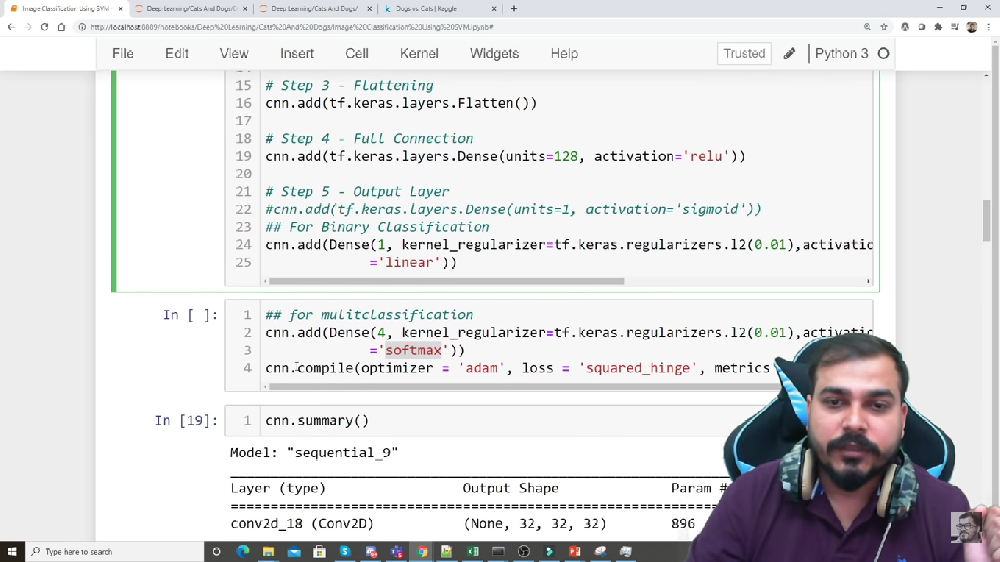 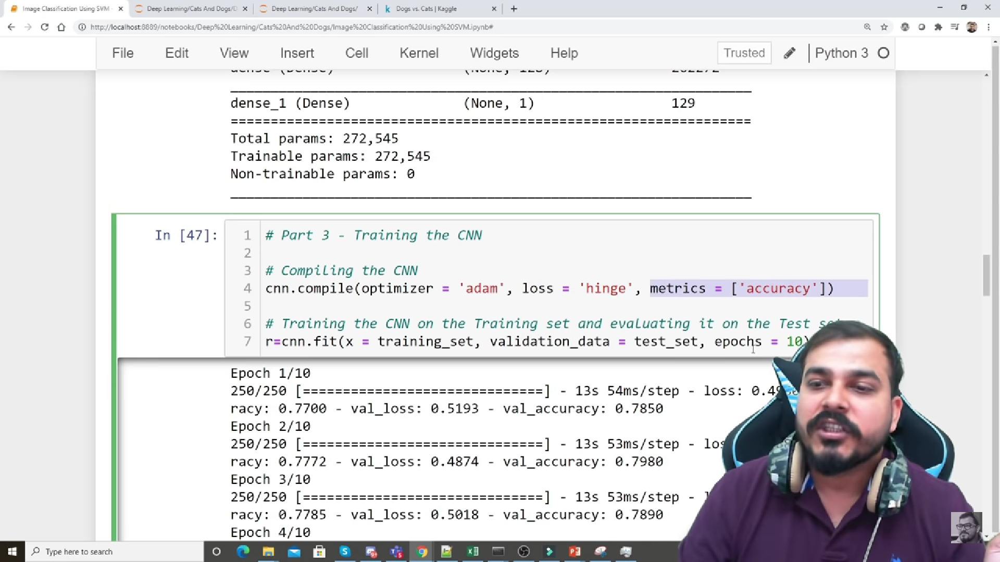